In [21]:
import zipfile
import os
from PIL import Image
import json
import pandas as pd
import matplotlib.pyplot as plt

#Análise exploratória

In [22]:
# Caminho para o arquivo ZIP
zip_path = '/content/drive/MyDrive/Modulo9/poseAnimal.zip'

# Diretório de destino para extrair o conteúdo
extract_path = '/content/pose'

# Certifique-se de que o diretório de destino existe
os.makedirs(extract_path, exist_ok=True)

# Abrir e extrair o arquivo ZIP
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extração concluída!")


Extração concluída!


Aqui eu faço uma análise exploratória do dataset. Carrego o json e vou estudando o que há de informações nele

In [23]:
file = '/content/pose/keypoints.json'
with open(file) as train_file:
    dict_train = json.load(train_file)


In [24]:
dict_train.keys()

dict_keys(['images', 'annotations', 'categories', 'info'])

In [25]:
dict_train['images']

{'1': '2007_000063.jpg',
 '2': '2007_000175.jpg',
 '3': '2007_000332.jpg',
 '4': '2007_000392.jpg',
 '5': '2007_000464.jpg',
 '6': '2007_000491.jpg',
 '7': '2007_000504.jpg',
 '8': '2007_000528.jpg',
 '9': '2007_000549.jpg',
 '10': '2007_000676.jpg',
 '11': '2007_000720.jpg',
 '12': '2007_000783.jpg',
 '13': '2007_000799.jpg',
 '14': '2007_000836.jpg',
 '15': '2007_000876.jpg',
 '16': '2007_000904.jpg',
 '17': '2007_000925.jpg',
 '18': '2007_001073.jpg',
 '19': '2007_001185.jpg',
 '20': '2007_001416.jpg',
 '21': '2007_001225.jpg',
 '22': '2007_001239.jpg',
 '23': '2007_001299.jpg',
 '24': '2007_001340.jpg',
 '25': '2007_001397.jpg',
 '26': '2007_001586.jpg',
 '27': '2007_001594.jpg',
 '28': '2007_001420.jpg',
 '29': '2007_001724.jpg',
 '30': '2007_001733.jpg',
 '31': '2007_001764.jpg',
 '32': '2007_001774.jpg',
 '33': '2007_001917.jpg',
 '34': '2007_001955.jpg',
 '35': '2007_002387.jpg',
 '36': '2007_002648.jpg',
 '37': '2007_003189.jpg',
 '38': '2007_001763.jpg',
 '39': '2007_003194.j

In [26]:
dict_train['annotations']

[{'image_id': 1,
  'bbox': [123, 115, 379, 275],
  'keypoints': [[193, 216, 1],
   [160, 217, 1],
   [174, 261, 1],
   [204, 186, 1],
   [152, 182, 1],
   [0, 0, 0],
   [0, 0, 0],
   [273, 168, 1],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [266, 225, 1],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [190, 145, 1],
   [351, 238, 1]],
  'num_keypoints': 20,
  'category_id': 1},
 {'image_id': 2,
  'bbox': [25, 34, 419, 271],
  'keypoints': [[330, 84, 1],
   [245, 91, 1],
   [290, 137, 1],
   [340, 71, 1],
   [225, 91, 1],
   [325, 223, 1],
   [168, 196, 1],
   [0, 0, 0],
   [94, 134, 1],
   [325, 253, 1],
   [166, 256, 1],
   [0, 0, 0],
   [53, 188, 1],
   [0, 0, 0],
   [0, 0, 0],
   [0, 0, 0],
   [41, 209, 1],
   [285, 202, 1],
   [0, 0, 0],
   [0, 0, 0]],
  'num_keypoints': 20,
  'category_id': 3},
 {'image_id': 3,
  'bbox': [54, 50, 285, 262],
  'keypoints': [[275, 102, 1],
   [247, 105, 1],
   [269, 156, 1],
   [271, 71, 1],
   [241, 78, 1],

In [27]:
dict_train['categories']

[{'supercategory': 'animal',
  'id': 1,
  'name': 'dog',
  'keypoints': ['left_eye',
   'right_eye',
   'nose',
   'left_ear',
   'right_ear',
   'left_front_elbow',
   'right_front_elbow',
   'left_back_elbow',
   'right_back_elbow',
   'left_front_knee',
   'right_front_knee',
   'left_back_knee',
   'right_back_knee',
   'left_front_paw',
   'right_front_paw',
   'left_back_paw',
   'right_back_paw',
   'throat',
   'withers',
   'tailbase'],
  'skeleton': [[0, 1],
   [0, 2],
   [1, 2],
   [0, 3],
   [1, 4],
   [2, 17],
   [18, 19],
   [5, 9],
   [6, 10],
   [7, 11],
   [8, 12],
   [9, 13],
   [10, 14],
   [11, 15],
   [12, 16]]},
 {'supercategory': 'animal',
  'id': 2,
  'name': 'cat',
  'keypoints': ['left_eye',
   'right_eye',
   'nose',
   'left_ear',
   'right_ear',
   'left_front_elbow',
   'right_front_elbow',
   'left_back_elbow',
   'right_back_elbow',
   'left_front_knee',
   'right_front_knee',
   'left_back_knee',
   'right_back_knee',
   'left_front_paw',
   'right_fron

In [28]:
dict_train['info']

{'description': 'Animal Pose dataset from ICCV 2021 paper Cross-Domain Adaptation for Animal Pose Estimation',
 'url': 'https://sites.google.com/view/animal-pose/',
 'github': 'https://github.com/noahcao/animal-pose-dataset.git',
 'contributor': 'Jinkun Cao, Hongyang Tang and Tencent Youtu X lab team',
 'date_updated': '2021/7/14',
 'resource': 'some images come from PASCAL VOC2011 dataset, whose are named as $year_$index.jpg, the other images are from public online resources'}

Explorando o json, identifiquei que a seção 'annotations' contém dados essenciais para a análise que será realizada ao longo do Colab, com isso eu tranformo o 'annotations' em um data frame para uma melhor visualização dos dados

In [29]:
dataframe = pd.DataFrame(dict_train['annotations'])

In [30]:
dataframe

,image_id,bbox,keypoints,num_keypoints,category_id
0,1,"[123, 115, 379, 275]","[[193, 216, 1], [160, 217, 1], [174, 261, 1], ...",20,1
1,2,"[25, 34, 419, 271]","[[330, 84, 1], [245, 91, 1], [290, 137, 1], [3...",20,3
2,3,"[54, 50, 285, 262]","[[275, 102, 1], [247, 105, 1], [269, 156, 1], ...",20,4
3,4,"[100, 96, 355, 324]","[[0, 0, 0], [327, 161, 1], [350, 192, 1], [333...",20,4
4,5,"[71, 252, 216, 314]","[[103, 269, 1], [86, 269, 1], [92, 284, 1], [1...",20,5
...,...,...,...,...,...
6112,4604,"[33, 63, 547, 559]","[[119, 140, 1], [0, 0, 0], [48, 183, 1], [158,...",20,3
6113,4605,"[119, 50, 729, 594]","[[656, 113, 1], [0, 0, 0], [580, 181, 1], [683...",20,3
6114,4606,"[105, 38, 565, 598]","[[250, 91, 1], [166, 91, 1], [214, 148, 1], [2...",20,3
6115,4607,"[65, 54, 263, 202]","[[245, 93, 1], [210, 94, 1], [232, 115, 1], [2...",20,3


In [31]:
# Verifico as classes unicas presente no dataset
dataframe['category_id'].unique()

array([1, 3, 4, 5, 2])

Aqui eu mostro as animais (classes) presentes no dataset

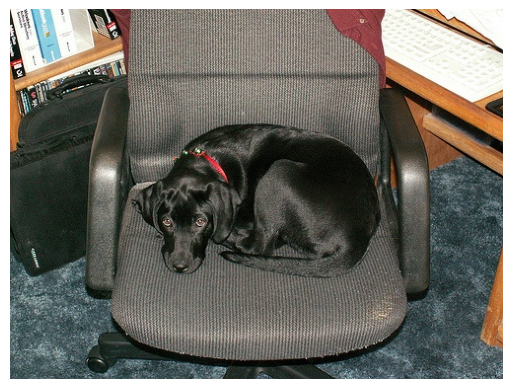

In [32]:
key = dict_train['images'][f'1'] #categorical 1 = cachorro
image = Image.open(f'/content/pose/images/images/{key}')
plt.imshow(image)
plt.axis('off')
plt.show()

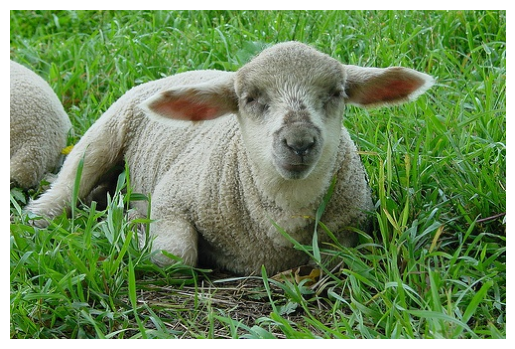

In [33]:
key = dict_train['images'][f'2'] #categorical 3 = ovelha
image = Image.open(f'/content/pose/images/images/{key}')
plt.imshow(image)
plt.axis('off')
plt.show()

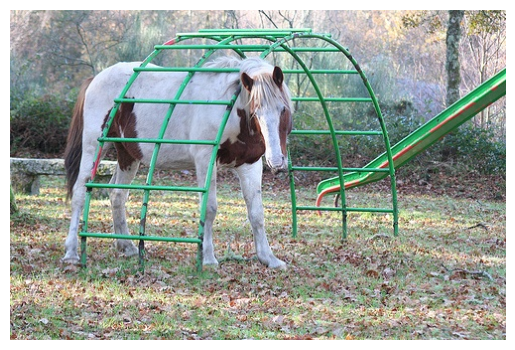

In [34]:
key = dict_train['images'][f'3'] #categorical 4 = cavalo
image = Image.open(f'/content/pose/images/images/{key}')
plt.imshow(image)
plt.axis('off')
plt.show()

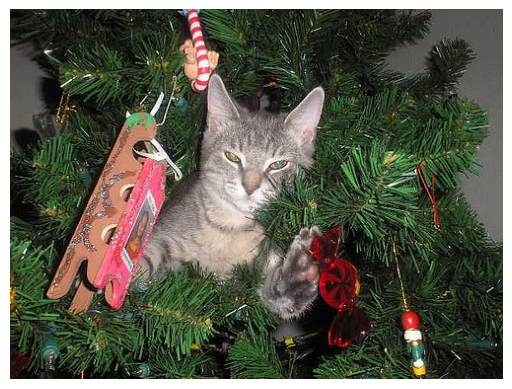

In [35]:
key = dict_train['images'][f'8'] #categorical 2 = gato
image = Image.open(f'/content/pose/images/images/{key}')
plt.imshow(image)
plt.axis('off')
plt.show()

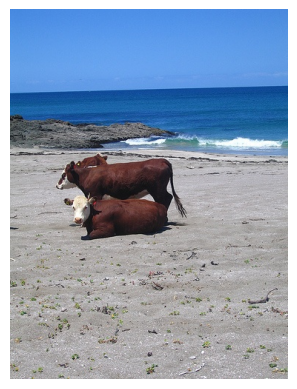

In [36]:
key = dict_train['images'][f'5'] #categorical 2 = boi
image = Image.open(f'/content/pose/images/images/{key}')
plt.imshow(image)
plt.axis('off')
plt.show()

Em seguida eu apresento um gráfico sobre a distribuição de diferentes classes/imagens presentes no dataFrame e a quantidade total de bovinos presente nele

<ipython-input-37-f668f6837728>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")


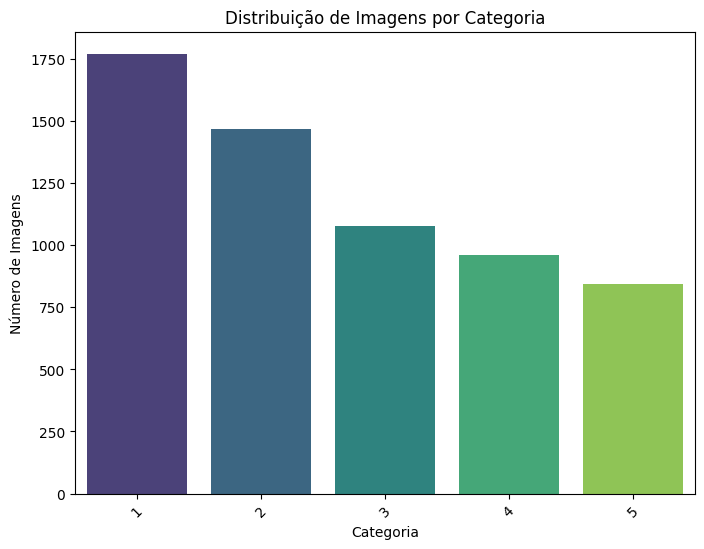

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

# Contagem de imagens por categoria
category_counts = dataframe.groupby('category_id')['image_id'].count()

# Gráfico de barras comparando o número total de imagens em cada categoria
plt.figure(figsize=(8, 6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette="viridis")
plt.title('Distribuição de Imagens por Categoria')
plt.xlabel('Categoria')
plt.ylabel('Número de Imagens')
plt.xticks(rotation=45)
plt.show()


In [38]:
#Numero de imagens de bovinos
dataframe[dataframe['category_id'] == 5].shape[0]

842

Aqui eu mostro de uma maneira geral os dados presentes no dataframe com um describe()

In [39]:
dataframe.describe()

,image_id,num_keypoints,category_id
count,6117.000000,6117.0,6117.000000
mean,2171.929704,20.0,2.613536
std,1288.668195,0.0,1.398659
min,1.000000,20.0,1.000000
25%,1084.000000,20.0,1.000000
50%,2116.000000,20.0,2.000000
75%,3264.000000,20.0,4.000000
max,4608.000000,20.0,5.000000


#Filtragem e processamento do dataset

Aqui eu faço a filtragem do dataset para que somente as imagens de bovinos estejam presentes e a partir disso eu crio um novo dataframe para uma melhor manipulação e analise dos dados  

In [40]:
cow_df= dataframe[dataframe['category_id'] == 5]

In [41]:
cow_df.head()

,image_id,bbox,keypoints,num_keypoints,category_id
4,5,"[71, 252, 216, 314]","[[103, 269, 1], [86, 269, 1], [92, 284, 1], [1...",20,5
5,5,"[58, 202, 241, 295]","[[73, 225, 1], [0, 0, 0], [64, 240, 1], [84, 2...",20,5
6,6,"[2, 2, 459, 334]","[[0, 0, 0], [255, 46, 1], [308, 88, 1], [171, ...",20,5
7,7,"[341, 102, 500, 406]","[[363, 125, 1], [0, 0, 0], [343, 147, 1], [385...",20,5
17,16,"[237, 167, 338, 263]","[[248, 205, 1], [0, 0, 0], [238, 222, 1], [254...",20,5


In [42]:
cow_df.describe()

,image_id,num_keypoints,category_id
count,842.000000,842.0,842.0
mean,2306.870546,20.0,5.0
std,1330.762234,0.0,0.0
min,5.000000,20.0,5.0
25%,1235.000000,20.0,5.0
50%,2185.000000,20.0,5.0
75%,3572.750000,20.0,5.0
max,4008.000000,20.0,5.0


In [43]:
cow_df.count()

,0
image_id,842
bbox,842
keypoints,842
num_keypoints,842
category_id,842


Ploto as 5 primeiras imagens de bovinos presentes no dataframe

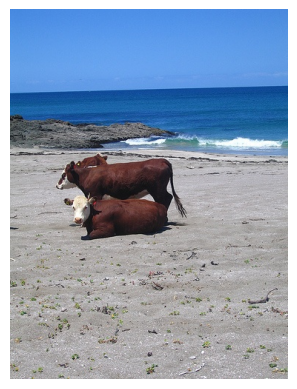

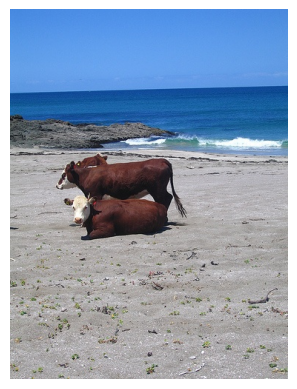

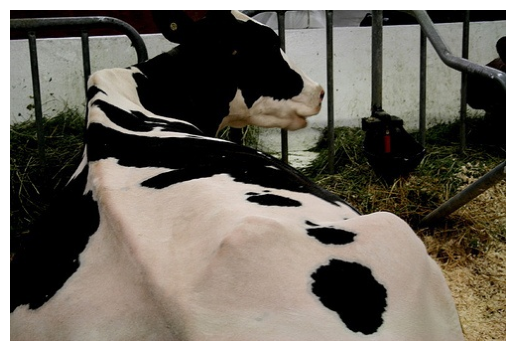

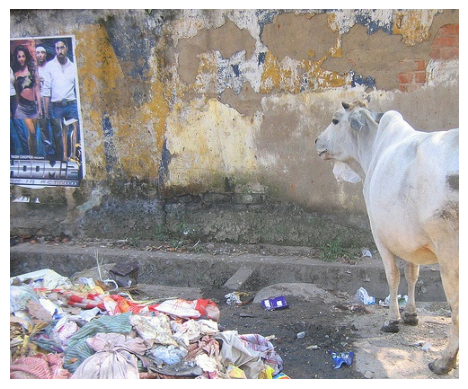

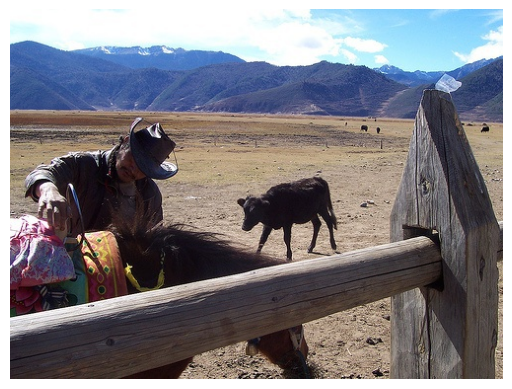

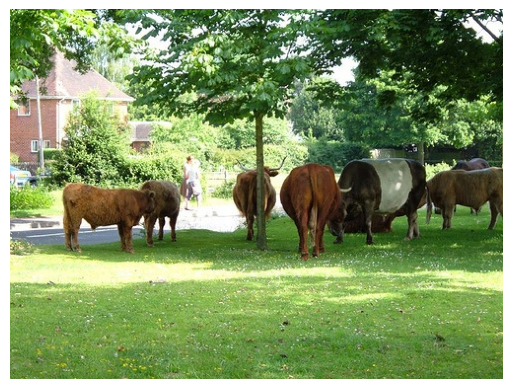

In [44]:
from PIL import Image
import matplotlib.pyplot as plt

num_linhas = cow_df.shape[0]

for i in range(0, num_linhas):
    image_id = cow_df.iloc[i, 0]
    key = dict_train['images'][f'{image_id}']
    image = Image.open(f'/content/pose/images/images/{key}')

    # Exibe as 5 primeiras imagens usando matplotlib
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    if i == 5:
        break


Nesta célula, eu gero um gráfico de barras utilizando para comparar a quantidade total de imagens de bois com o número de imagens únicas de bois no dataset. O gráfico mostra essa diferença e ajuda a entender a distribuição das imagens dentro da categoria 'boi'.

<ipython-input-53-78fef1563b15>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["Imagens bovinas","Imagens bovinas unicas"], y=[cow_df['image_id'].count(),cow_df['image_id'].nunique()], palette="viridis")


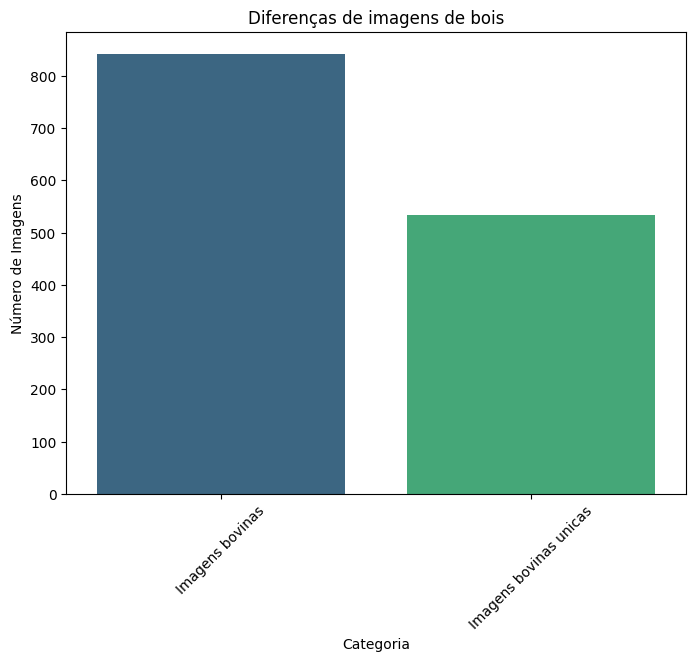

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# Contagem de imagens por categoria
category_counts = cow_df.groupby('category_id')['image_id'].nunique()

# Gráfico de barras comparando o número total de imagens em cada categoria
plt.figure(figsize=(8, 6))
sns.barplot(x=["Imagens bovinas","Imagens bovinas unicas"], y=[cow_df['image_id'].count(),cow_df['image_id'].nunique()], palette="viridis")
plt.title('Diferenças de imagens de bois')
plt.xlabel('Categoria')
plt.ylabel('Número de Imagens')
plt.xticks(rotation=45)
plt.show()


In [52]:
cow_df['image_id'].nunique()

534

#Apresentando os resultados

Nesta seção, utilizaremos o framework MediaPipe para tentar prever a pose estimation dos bovinos e, a partir disso, gerar uma discussão sobre os resultados obtidos.

In [32]:
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 17.7 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.5 which is incompatible.


In [33]:
# Importando o módulo Pose do MediaPipe e utilitários para desenho
import mediapipe as mp
mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

# Exibindo a documentação da classe Pose
help(mp_pose.Pose)


Help on class Pose in module mediapipe.python.solutions.pose:

class Pose(mediapipe.python.solution_base.SolutionBase)
 |  Pose(static_image_mode=False, model_complexity=1, smooth_landmarks=True, enable_segmentation=False, smooth_segmentation=True, min_detection_confidence=0.5, min_tracking_confidence=0.5)
 |  
 |  MediaPipe Pose.
 |  
 |  MediaPipe Pose processes an RGB image and returns pose landmarks on the most
 |  prominent person detected.
 |  
 |  Please refer to https://solutions.mediapipe.dev/pose#python-solution-api for
 |  usage examples.
 |  
 |  Method resolution order:
 |      Pose
 |      mediapipe.python.solution_base.SolutionBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, static_image_mode=False, model_complexity=1, smooth_landmarks=True, enable_segmentation=False, smooth_segmentation=True, min_detection_confidence=0.5, min_tracking_confidence=0.5)
 |      Initializes a MediaPipe Pose object.
 |      
 |      Args:
 |        static_i

Aqui, desenvolvemos um método que irá extrair cada imagem do dataframe de bovinos e plotar o pose estimation que esperamos que o framework Mediapipe nos forneça.

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
# Função para desenhar keypoints e bounding box
def plot_keypoints(image, bbox, keypoints):
    # Desenhar a bounding box
    x, y, w, h = bbox
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Desenhar os keypoints
    for kp in keypoints:
        if kp[2] > 0:  # Se a visibilidade for maior que 0, desenha o ponto
            cv2.circle(image, (kp[0], kp[1]), 5, (0, 0, 255), -1)

    return image

##Predição


Nesta seção, apresentarei os resultados obtidos. Primeiro, extraio uma amostra de 100 linhas do dataframe e a armazeno em uma variável para que possamos passar essas amostras ao nosso modelo para prever as estimativas de pose.

In [95]:
# Pegar os índices aleatórios
amostras_idx = random.sample(range(len(cow_df)), 100)

# Criar um novo DataFrame com as amostras aleatórias
df_amostra = cow_df.iloc[amostras_idx]

In [96]:
df_amostra

,image_id,bbox,keypoints,num_keypoints,category_id
115,72,"[50, 130, 174, 219]","[[0, 0, 0], [164, 151, 1], [171, 160, 1], [0, ...",20,5
4467,3187,"[1, 78, 313, 500]","[[228, 206, 1], [133, 224, 1], [193, 301, 1], ...",20,5
4953,3500,"[45, 153, 179, 280]","[[156, 180, 1], [136, 181, 1], [135, 217, 1], ...",20,5
5361,3853,"[7, 7, 297, 201]","[[43, 54, 1], [0, 0, 0], [18, 83, 1], [59, 43,...",20,5
4776,3392,"[192, 211, 263, 279]","[[219, 230, 1], [207, 230, 1], [215, 242, 1], ...",20,5
...,...,...,...,...,...
112,70,"[163, 184, 273, 269]","[[0, 0, 0], [258, 214, 1], [268, 231, 1], [0, ...",20,5
5044,3558,"[174, 149, 236, 186]","[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [...",20,5
5366,3858,"[7, 8, 289, 200]","[[0, 0, 0], [260, 24, 1], [283, 35, 1], [0, 0,...",20,5
1843,1291,"[251, 215, 292, 243]","[[257, 222, 1], [254, 222, 1], [255, 227, 1], ...",20,5


Nesta célula, envio as 100 linhas do dataframe de amostra para o framework gerar as predições. Ao lado, comparo o que o modelo previu com a imagem esperada. A partir dessa comparação, podemos obter insights sobre a performance do modelo

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


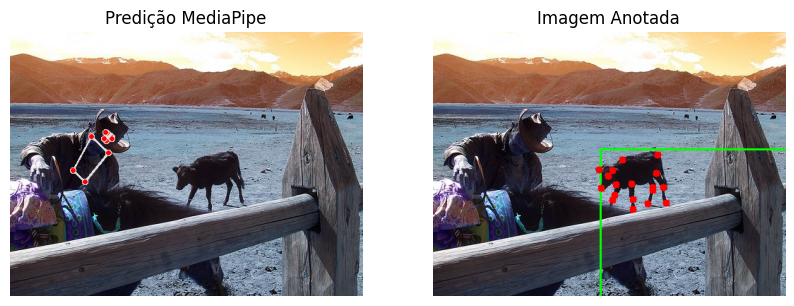

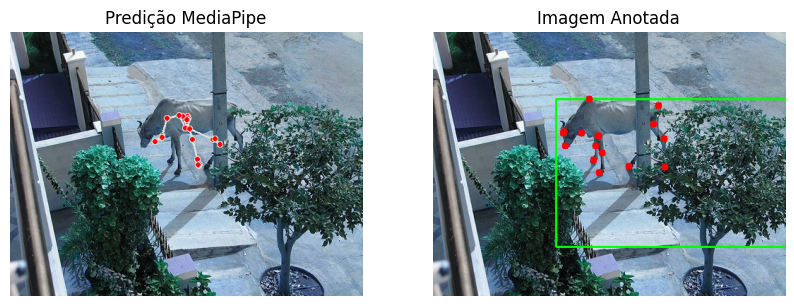

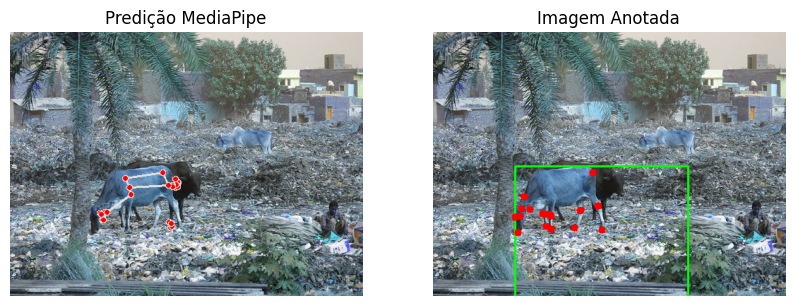

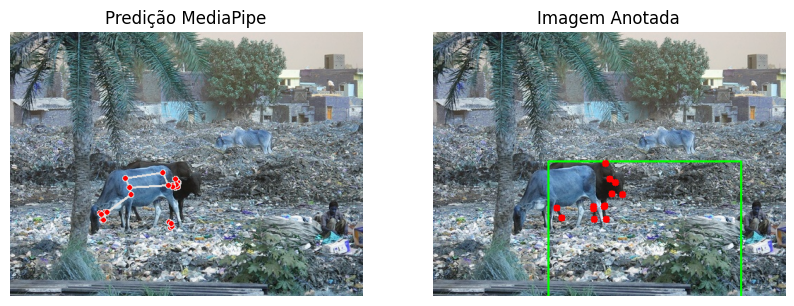

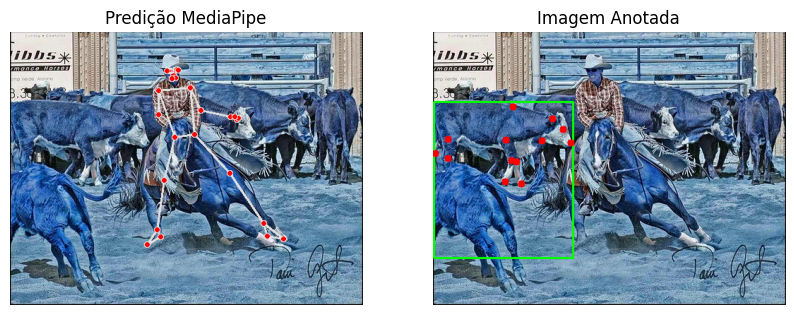

...

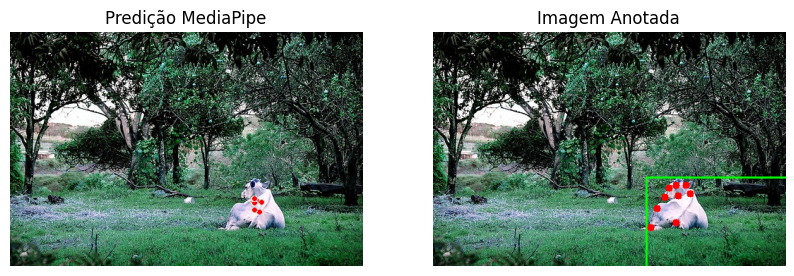

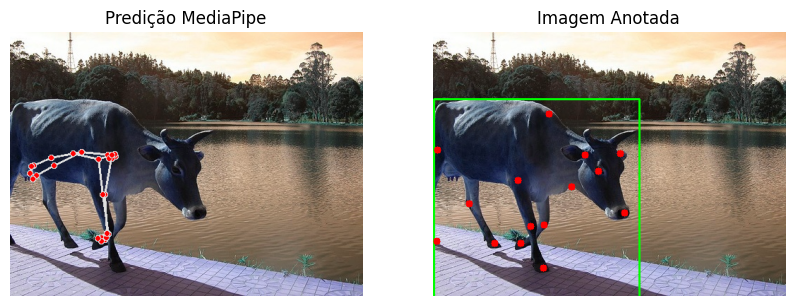

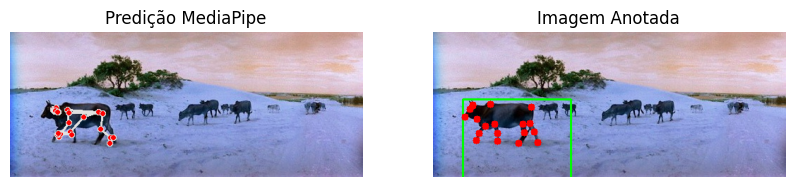

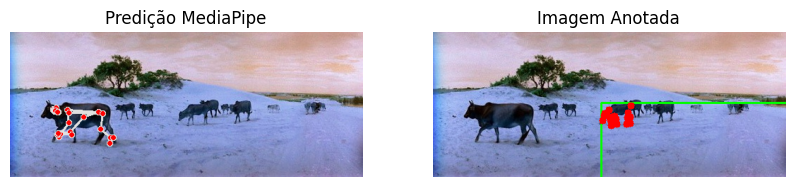

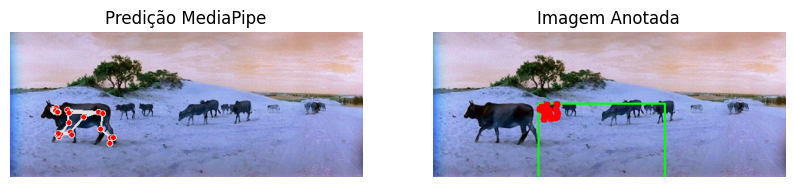

In [53]:
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd
import random

mp_pose = mp.solutions.pose
mp_drawing = mp.solutions.drawing_utils

# Configurar MediaPipe Pose
with mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5, model_complexity=2) as pose:
    for i in range(0, df_amostra.shape[0]):

        image_id = cow_df.iloc[i, 0]

        key = dict_train['images'][f'{image_id}']

        image = Image.open(f'/content/pose/images/images/{key}')

        image_np = np.array(image)

        # Converter a imagem de PIL para RGB e processar com MediaPipe
        results = pose.process(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))

        # Desenhar bbox e keypoints na imagem
        image_np = np.array(image)
        image_with_annotations = plot_keypoints(image_np.copy(), cow_df.iloc[i, 1], cow_df.iloc[i, 2])


        if results.pose_landmarks:
            keypoints = []
            for landmark in results.pose_landmarks.landmark:
                keypoints.append([landmark.x, landmark.y, landmark.visibility])  # Coordenadas normalizadas

            # Desenhar os keypoints na imagem
            annotated_image = image_np.copy()
            mp_drawing.draw_landmarks(annotated_image, results.pose_landmarks, mp_pose.POSE_CONNECTIONS)

            plt.figure(figsize=(10, 5))

            # Plot da imagem anotada pela predição MediaPipe
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
            plt.title('Predição MediaPipe')
            plt.axis('off')

            # Plot da imagem com bounding box e keypoints desenhados
            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(image_with_annotations, cv2.COLOR_BGR2RGB))
            plt.title('Imagem Anotada')
            plt.axis('off')

            # Mostrar a imagem
            plt.show()


In [65]:
tabela_relação = {
    "total_img_dataset": [100],
    "total_img_predita": [15],
    "classe_boi_predita":[10],
    "outra_classe_predita":[5],
}

pd.DataFrame(tabela_relação)

,total_img_dataset,total_img_predita,classe_boi_predita,outra_classe_predita
0,100,15,10,5


Após a estimativa de pose, concluímos que os resultados não foram satisfatórios. De 100 amostras, apenas 15 foram preditas corretamente, com 5 dessas previsões apresentando erros. Isso indica que o modelo de estimativa de pose não foi treinado para identificar bovinos, mas sim para humanos.